# Lane Detection Project
---

1. _Intrinsic Camera calibration to undistort image_
2. _Perspective unwrapping to make road lines be parallel_
3. _Image binarization for getting pixels scores_
4. _Lines tracking and approximation_

### Import modules

In [12]:
from matplotlib import pyplot as plt
import numpy as np
import math
import cv2
import glob
import os
import yaml
from moviepy.editor import VideoFileClip
from IPython.display import HTML

### Common helper functions

In [13]:
# functions for save/load data

def save_yaml(filename, data):
    
    with open(filename, 'w') as f1:
        yaml.dump(data.tolist(), f1)
    
    
def load_yaml(filename):
    
    data = []
    if os.path.exists(filename):
        with open(filename) as f1:
            data = yaml.load(f1, Loader=yaml.FullLoader)
            
        data = np.array(data)
    
    return data


def load_intrinsic():
    k = []
    dist = []
    
    k = load_yaml('k.yaml')
    dist = load_yaml('dist.yaml')
    
    return k.reshape(3,3), np.squeeze(dist)

def save_intrinsic(k,dist):

    with open('k.yaml', 'w') as f1:
        yaml.dump(k.tolist(), f1)

    with open('dist.yaml', 'w') as f2:
        yaml.dump(dist.tolist(), f2)


def print_colored(string, color='NONE'):
    '''
    This function was created just for training purposes only
    '''
    colors_esc = {
        'ENDC'      : '\x1b[0m',
        'BOLD'      : '\x1b[1m',
        'UNDERLINE' : '\x1b[4m',
        'INVERSE'   : '\x1b[7m',
        'RED_L'     : '\x1b[31m',
        'GREEN_L'   : '\x1b[32m',
        'YELLOW_L'  : '\x1b[33m',
        'BLUE_L'    : '\x1b[34m',
        'MAGENTA_L' : '\x1b[35m',
        'CYAN_L'    : '\x1b[36m',
        'GRAY_L'    : '\x1b[37m',
        'DARK_B'    : '\x1b[40m',
        'RED_B'     : '\x1b[41m',
        'GREEN_B'   : '\x1b[42m',
        'YELLOW_B'  : '\x1b[43m',
        'BLUE_B'    : '\x1b[44m',
        'MAGENTA_B' : '\x1b[45m',
        'CYAN_B'    : '\x1b[46m',
        'GRAY_B'    : '\x1b[47m',
        'RED'       : '\x1b[91m',
        'GREEN'     : '\x1b[92m',
        'YELLOW'    : '\x1b[93m',
        'BLUE'      : '\x1b[94m',
        'MAGENTA'   : '\x1b[95m',
        'CYAN'      : '\x1b[96m',
        'GRAY'      : '\x1b[97m',
        'NONE'      : ''
        }
    
    if color in colors_esc:
        StartStr = colors_esc[color]
    else:
        StartStr = ''
        
    EndStr = colors_esc['ENDC']

    print(StartStr + string + EndStr)
    

def print_shape(data):
    print(np.array(data).shape)
    

## Camera calibration functions

In [14]:
def camera_calibration(images_path, corners_size = (9,6), show_flag = False):
    '''
    Compute an estimation of inrinsic parameters and distortion coeffs of the videocamera
    images_path - full path to images with chessboard pattern
    corners_size - horizontal and vertical size of chessboard (amount of inner corners)
    '''
    
    # default parameters
    ret = False
    k = None
    dist = None
    
    #minimal amount of images in calibration set
    min_images_count = 10

    chess_images_jpg = glob.glob(images_path + '/*.jpg')
    chess_images_bmp = glob.glob(images_path + '/*.bmp')
    chess_images_png = glob.glob(images_path + '/*.png')
    
    #first find PNG (the best case), then BMP, then JPG (the worst case)
    if(len(chess_images_png) < min_images_count):
        if(len(chess_images_bmp) < min_images_count):
            if(len(chess_images_jpg) < min_images_count):
                print('Can\'t find enough amount of images!')
                return (ret, k, dist)
            
            else:
                chess_images = chess_images_jpg
        else:
            chess_images = chess_images_bmp
    else:
        chess_images = chess_images_png

    print_colored( str(len(chess_images)) + ' images found!','BLUE')
    
    corners_size_count = corners_size[0] * corners_size[1]

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objpts = np.zeros((corners_size_count,3), np.float32)
    objpts[:,:2] = np.mgrid[0:corners_size[0],0:corners_size[1]].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d point in real world space
    imgpoints = [] # 2d points in image plane.
    
    
    # termination criteria
    cal_criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    
    image_count = 0
    
    for file in chess_images:
        image = cv2.imread(file)
        
        if (image.size):
            image_count += 1
            image_work = image.copy()

            ret, corners = cv2.findChessboardCorners(image, corners_size)
            
            if (ret):
                corners = corners.reshape(-1,2)
                cv2.drawChessboardCorners(image_work, corners_size, corners, ret)

                objpoints.append(objpts)
                imgpoints.append(corners)

            else:
                print_colored('Can\'t detect corners in this image:', 'RED')

            if show_flag:
                plt.imshow(image_work)
                #plt.title('Image ' + str(image_count))
                plt.title(file)
                plt.show()
        
    ret = False
    
    if ( len(imgpoints) >= min_images_count ):
        ret, k, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (image.shape[1],image.shape[0]),
                                                         cameraMatrix = None, distCoeffs = None, criteria = cal_criteria)
        dist = np.squeeze(dist)

    if ret:
        #calibration success!
        
        print_colored('Original/Undistorted images:\n','GREEN')
        
        image_count = 0
        for file in chess_images: #including unprocessed images too
           
            if show_flag:
                
                image_count += 1
                
                image = cv2.imread(file)
                und_image = cv2.undistort(image, k, dist)
                
                print_colored('\tPair of ' + file, 'MAGENTA')
                
                fig = plt.figure(figsize=(16,6))
                plt.subplot(1,2,1)
                plt.imshow(image)

                plt.subplot(1,2,2)
                plt.imshow(und_image)
                
                plt.show()

                if (image_count == 1):
                    
                    print_colored('Image pair for ' + file + ' saved!\n', 'BLUE')
                    plt.savefig('examples/pair_of_images.png');

    else:
        print_colored('Can\'t calibrate camera: too few images were processed!','RED')
    
    return (ret, k, dist)



def undistort_frame(image, k, dist):
    und_image = cv2.undistort(image, k, dist)
    return und_image



def undistort_video(video_input):
    '''
    writes an undistorted video with name 'video_input'_undist.*
    '''
    from moviepy.editor import VideoFileClip
    from IPython.display import HTML
    
    global k, dist
    
    in_filename = os.path.basename(video_input)
    
    fileparts = os.path.splitext(in_filename)
    out_filename = fileparts[0] + '_undist' + fileparts[1]
    
    dirname = os.path.dirname(video_input)
    
    video_output = os.path.join(dirname, out_filename)
    
    print('--->> ',video_output)

    if os.path.exists(video_output):
        os.remove(video_output)
        
    video1 = VideoFileClip(video_input)
    video2 = video1.fl_image(undistort_frame)
    
    %time video2.write_videofile(video_output, audio=False)
    #video2.write_videofile(video_output, audio=False)

    
    HTML("""
    <video width="960" height="540" controls>
    <source src="{0}">
    </video>
    """.format(video_output))

    print('Video has been wrote!')

### Camera calibration procedure

20 images found!


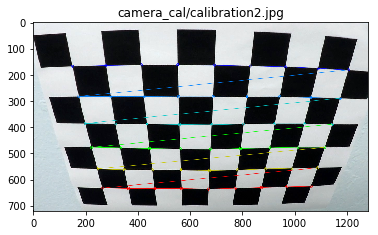

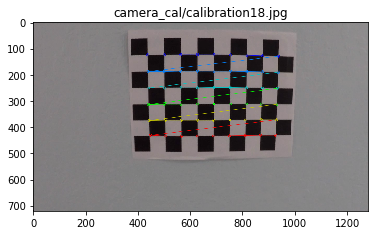

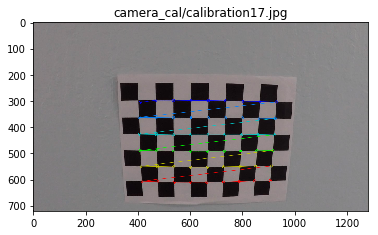

Can't detect corners in this image:


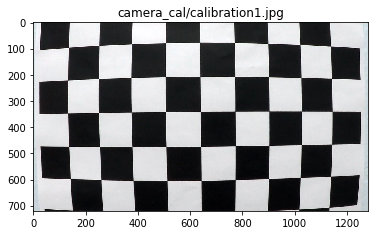

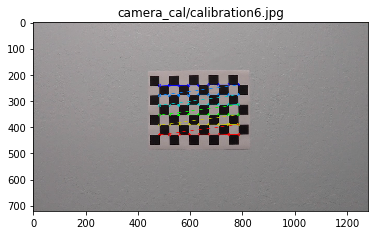

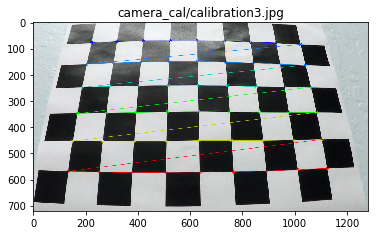

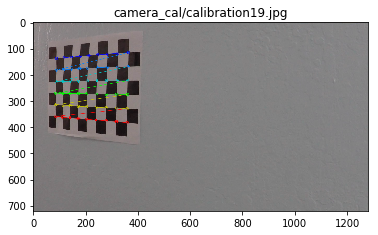

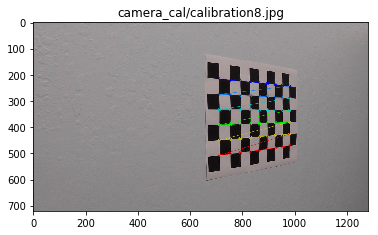

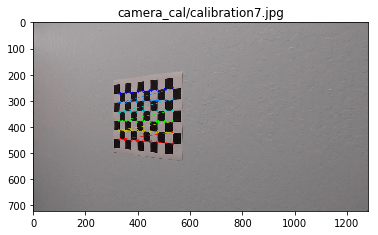

Can't detect corners in this image:


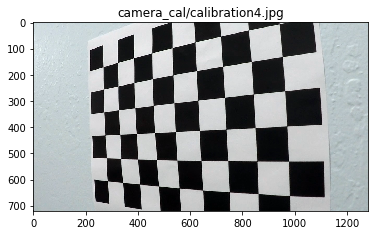

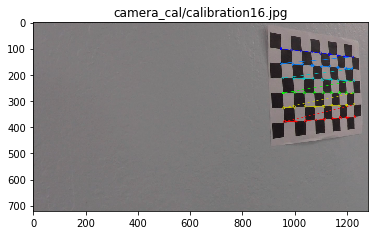

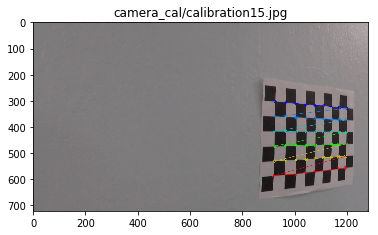

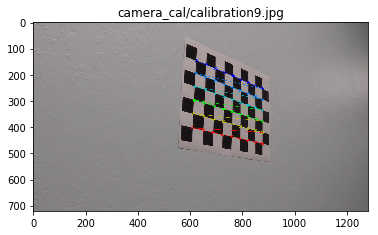

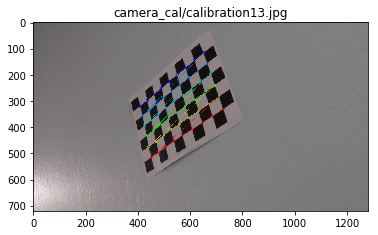

Can't detect corners in this image:


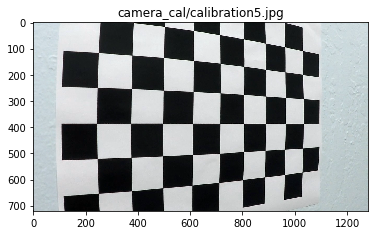

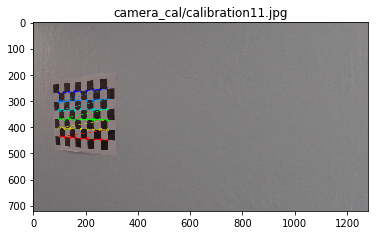

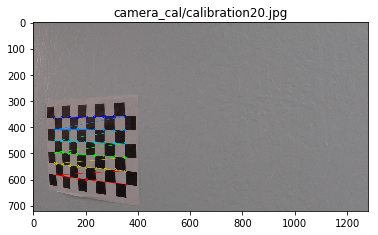

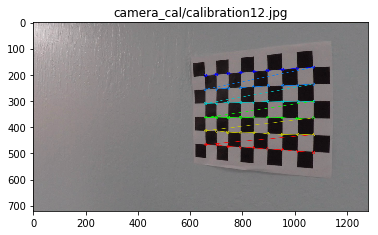

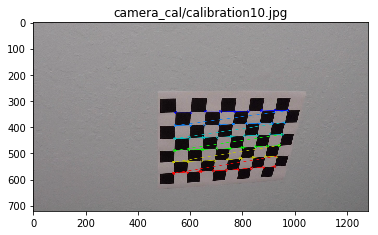

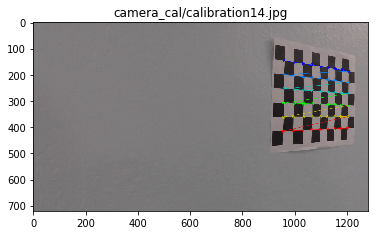

Original/Undistorted images:

	Pair of camera_cal/calibration2.jpg


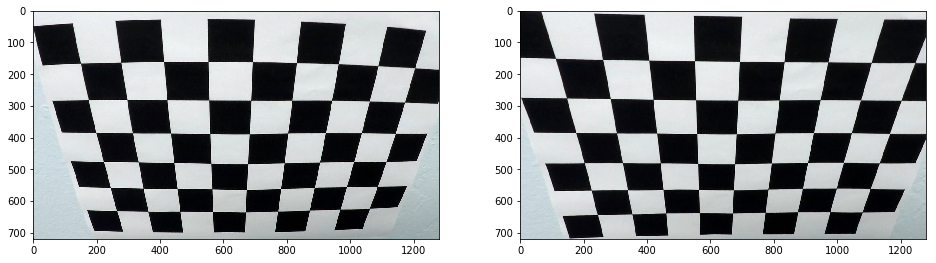

Image pair for camera_cal/calibration2.jpg saved!

	Pair of camera_cal/calibration18.jpg


<Figure size 432x288 with 0 Axes>

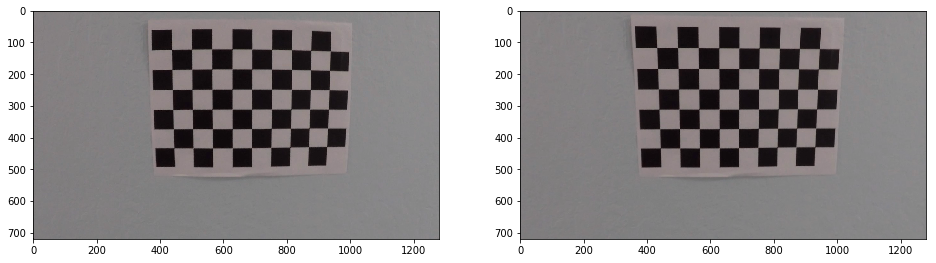

	Pair of camera_cal/calibration17.jpg


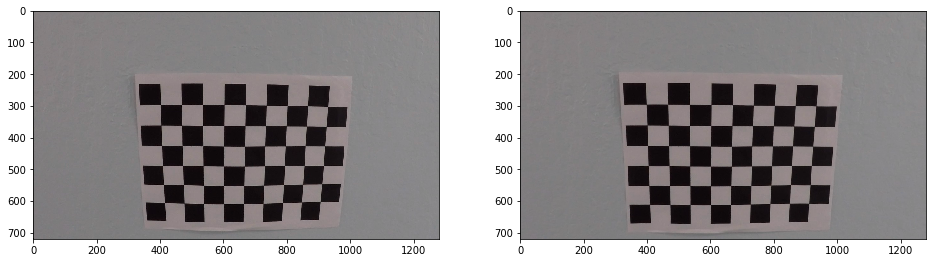

	Pair of camera_cal/calibration1.jpg


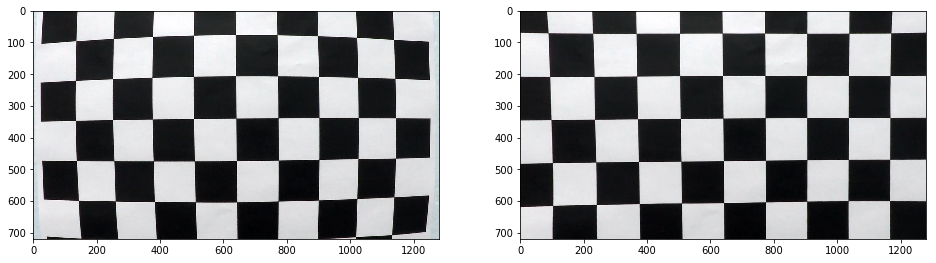

	Pair of camera_cal/calibration6.jpg


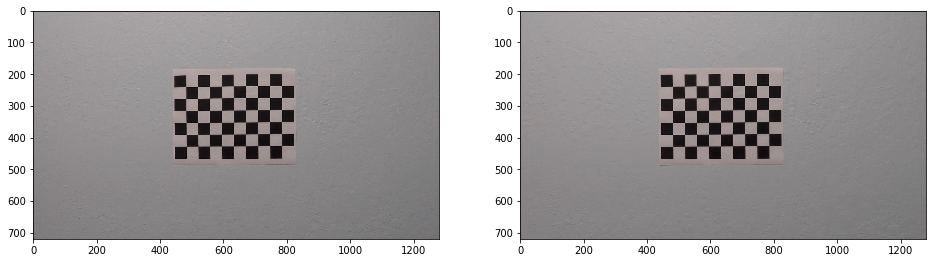

	Pair of camera_cal/calibration3.jpg


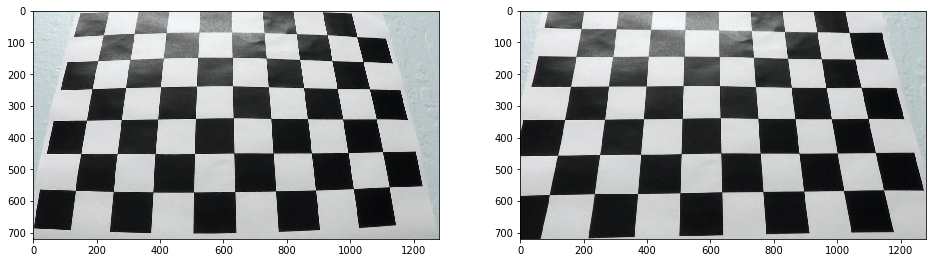

	Pair of camera_cal/calibration19.jpg


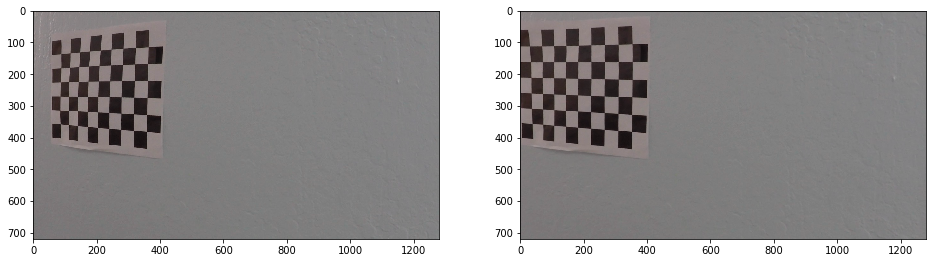

	Pair of camera_cal/calibration8.jpg


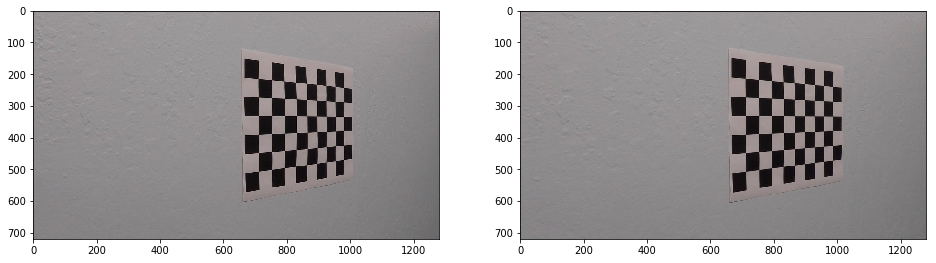

	Pair of camera_cal/calibration7.jpg


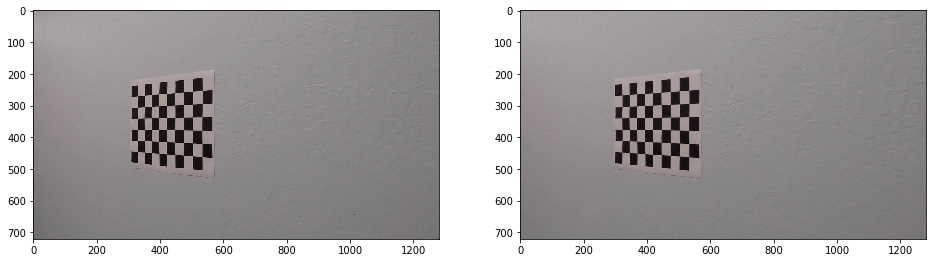

	Pair of camera_cal/calibration4.jpg


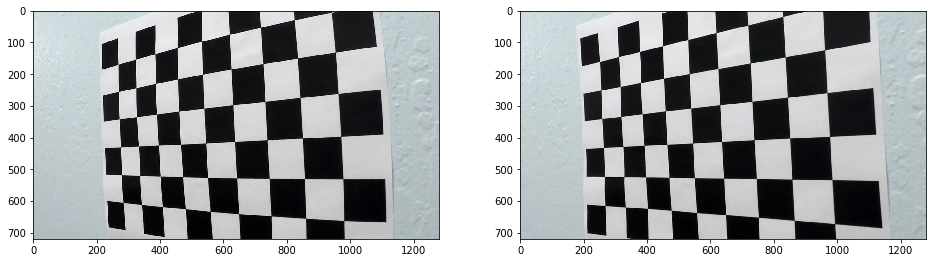

	Pair of camera_cal/calibration16.jpg


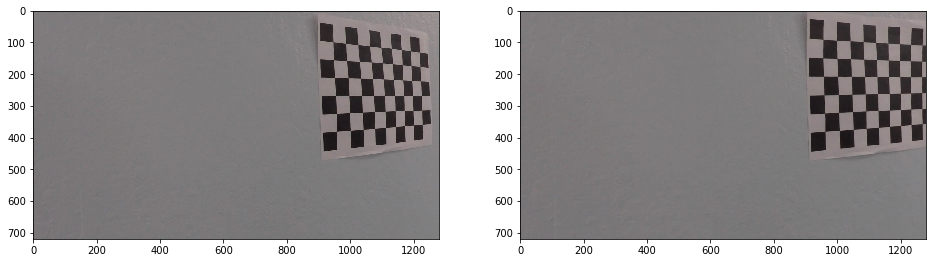

	Pair of camera_cal/calibration15.jpg


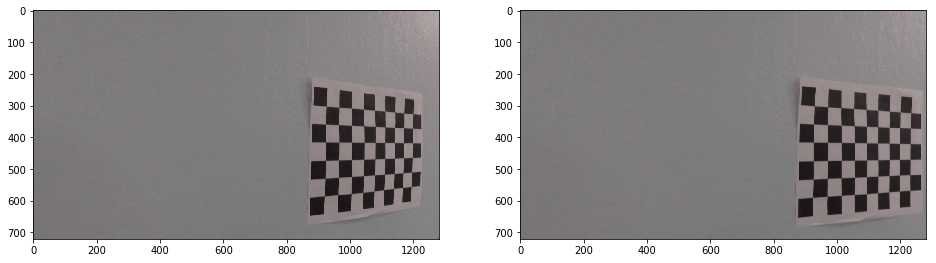

	Pair of camera_cal/calibration9.jpg


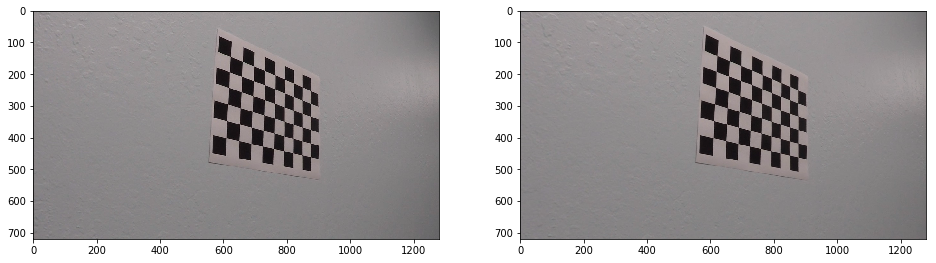

	Pair of camera_cal/calibration13.jpg


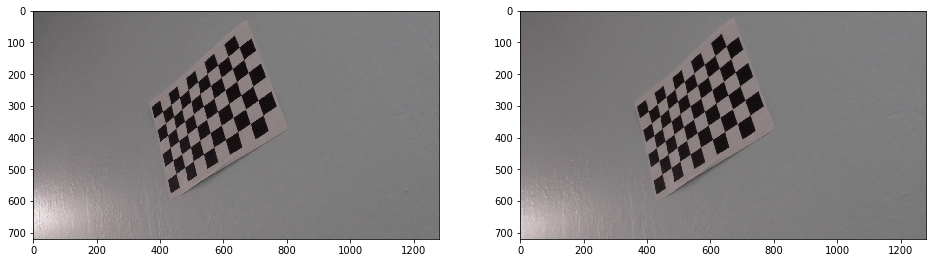

	Pair of camera_cal/calibration5.jpg


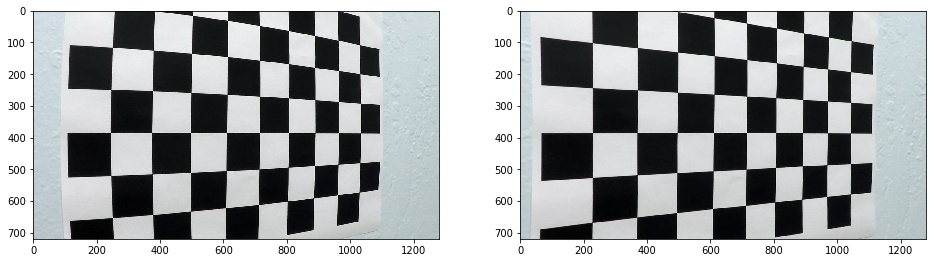

	Pair of camera_cal/calibration11.jpg


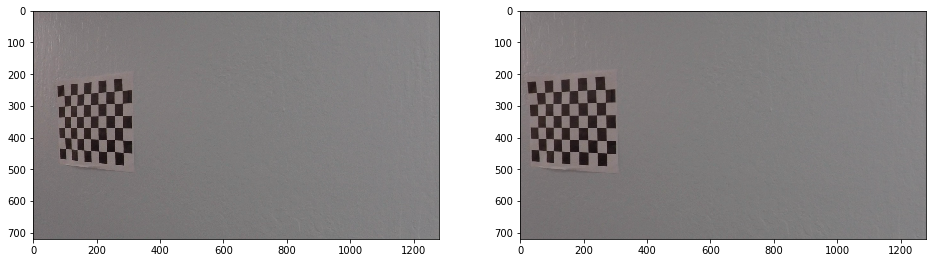

	Pair of camera_cal/calibration20.jpg


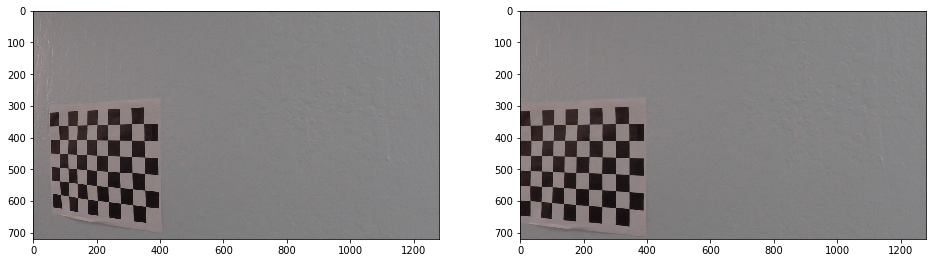

	Pair of camera_cal/calibration12.jpg


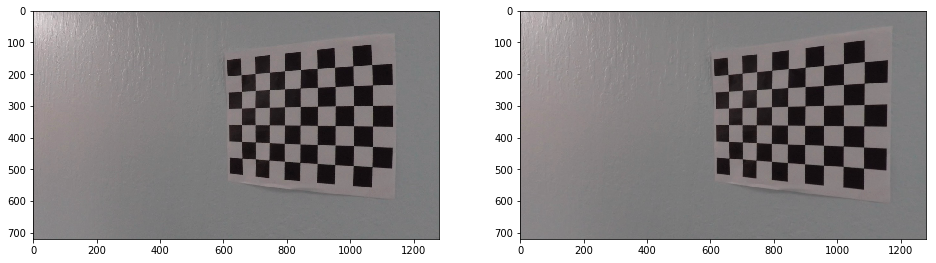

	Pair of camera_cal/calibration10.jpg


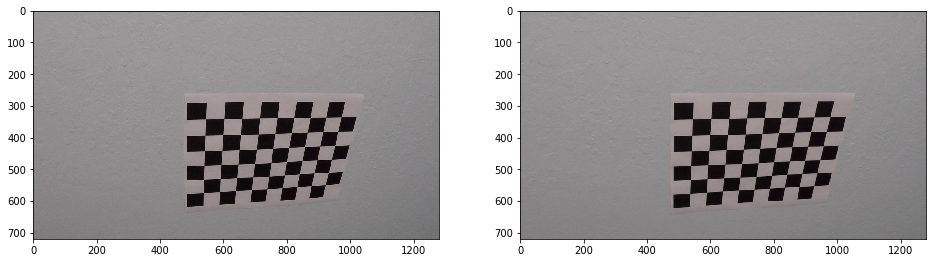

	Pair of camera_cal/calibration14.jpg


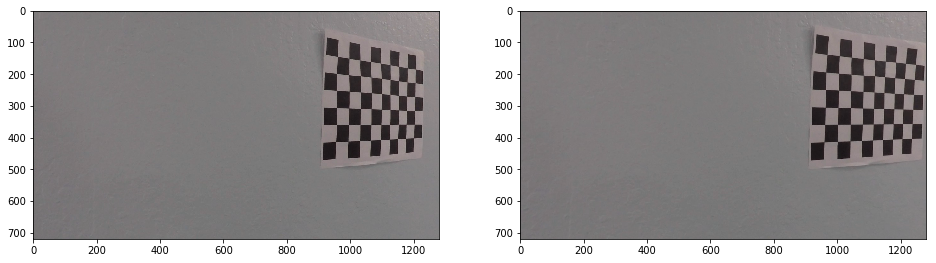


Intrinsic matrix:  [[1.15777169e+03 0.00000000e+00 6.66903178e+02]
 [0.00000000e+00 1.15281532e+03 3.86223553e+02]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Distortion coeffs:  [-0.24684965 -0.02379896 -0.00109624  0.0003447  -0.00284499]

Calibration data saved in k.yaml & dist.yaml!

=== Calibration done! ===


In [15]:
# Performs the camera calibration

corners_grid = (9,6)

#global k, dist

k = []
dist = []

ret, k, dist = camera_calibration('camera_cal/', corners_grid, show_flag=True)

if (ret):
    print("\nIntrinsic matrix: ",k)
    print("\nDistortion coeffs: ",dist)
    
    save_intrinsic(k,dist)
    print_colored('\nCalibration data saved in k.yaml & dist.yaml!','GREEN')
    print_colored('\n=== Calibration done! ===','GREEN')
    
else:
    print_colored('\nCan\'t calibrate camera!','RED')



## Test of calibration results:

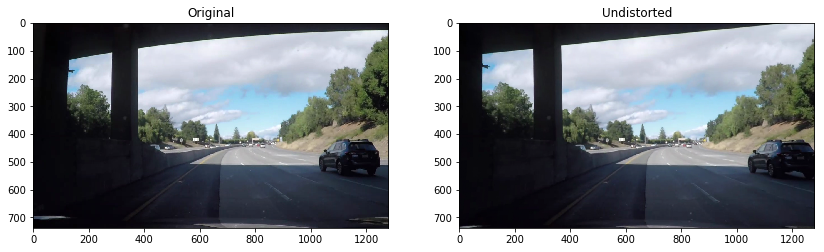

In [16]:
## Get perspective transformation matrix
#image = plt.imread('examples/ROI.png')
image = plt.imread('test_images/challenge_video.png')
image_u = undistort_frame(image,k,dist)

fig = plt.figure(figsize=(14,8))
plt.subplot(121)
plt.imshow(image)
plt.title('Original');

plt.subplot(122)
plt.imshow(image_u)
plt.title('Undistorted');

plt.savefig("examples/undistorted.png")

# undistort_video('challenge_video.mp4')

## Perspective transform for bird-eye view

Frames must be prepared in order to eliminate perspective distortion

To do this, actually it needs to determine the extrinsic camera parameters (camera pose) and to define
an area on the road surface to be projected on. But there is a light variant as described in the video lecture.

I found a straight part of road lane and marked it with rectangular area with 4 points and correct it manually: with the left-top corner at (320,470) and the right-bottom corner at (970,670)

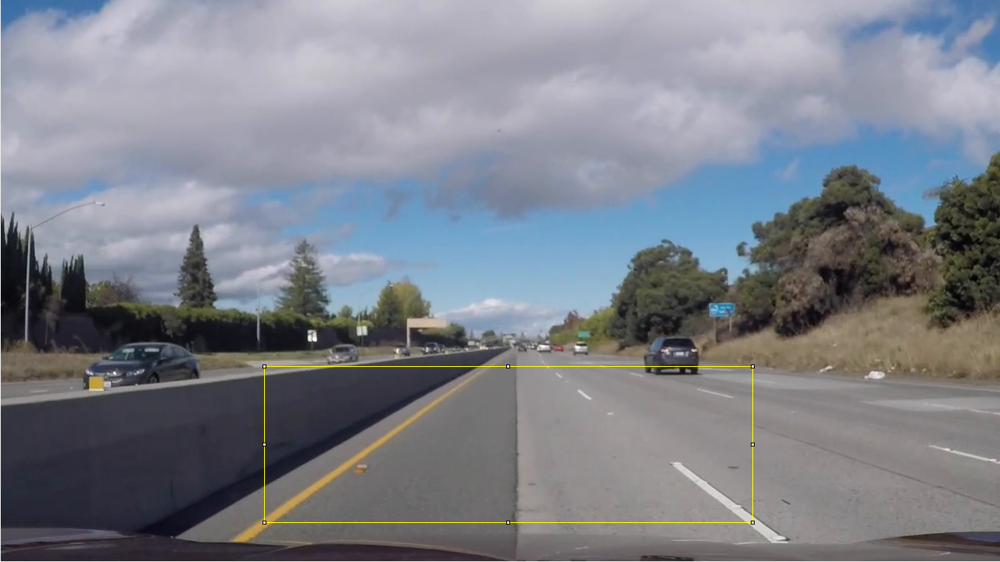

Then I find the points of intersection between middles of road lines and horizontal sides of ROI (at y_top = 470 and  y_bott = 670). It actually "turns" an image around bottom edge of the rectangle, then shift it down to bottom of image and scale to original size. As a result, I have transformed image with uncertain scale.

## Perspective transformation helper functions

In [19]:
def warp_image(image, M):
    
    img_size = (image.shape[1], image.shape[0]) #w,h
    warped = cv2.warpPerspective(image, M, img_size, flags=cv2.INTER_LINEAR)

    return warped

def define_warp_points():
    
    
    return image_box, road_ROI

def compute_bird_eye(image):
    '''
    Get perspective transformation matrices M, Minv
    '''
    img_size = (image.shape[1], image.shape[0]) #w,h
    y_max = img_size[1]-1
    
    # vertical margins of straight lane field
    y_bott = 670
    y_top = 470

    xl_bott = 320
    xr_bott = 970
    xl_top = 620
    xr_top = 700

    # left/right lane offset 
    field_offset = 100

    image_box = np.float32([[xl_bott, y_bott],
                            [xl_top,  y_top],
                            [xr_top,  y_top],
                            [xr_bott, y_bott]])

    road_ROI = np.float32([[xl_bott-field_offset, y_max],
                           [xl_bott-field_offset, 0],
                           [xr_bott+field_offset, 0],
                           [xr_bott+field_offset, y_max]])
    


    M = cv2.getPerspectiveTransform(image_box, road_ROI)
    Minv = cv2.getPerspectiveTransform(road_ROI, image_box)

    save_yaml('M.yaml',M)
    return M, Minv


## Perspective transformation test

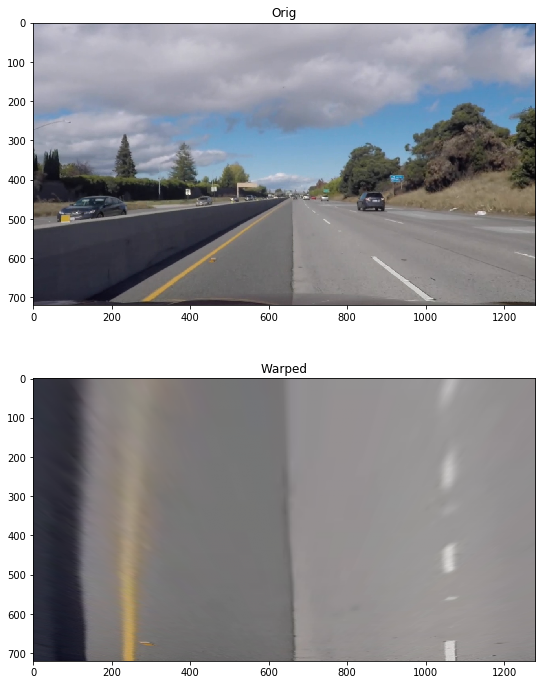

In [23]:
image = plt.imread('examples/ROI_area.png')
image_u = undistort_frame(image,k,dist)

M, M_1 = compute_bird_eye(image_u)

image_uw = warp_image(image, M)


plt.figure(figsize=(9,12))
plt.subplot(2,1,1)
plt.title('Orig')
plt.imshow(image_u)

plt.subplot(2,1,2)
plt.title('Warped')
plt.imshow(image_uw)
plt.savefig("examples/unwarped.png")


## Image binarization function

In [50]:
def rgb_to_bin_for_video(image):
    '''
    '''
    bw = rgb_to_bin(image) * 255
    return np.dstack((bw,bw,bw)).astype(np.uint8)

def rgb_to_bin(image):
    '''
    Function applays a threshold to red component of the udistorted and unwarped image
    '''
    
    # 
    ## L = [0...1]
    
    ## Eliminate most dark regions to avoid unwanted thresholding results
    # L_thr = 130 / 255.0
    # L[ L < thr ] = thr
    
    red = image[:,:,0]
    
    red_ud = undistort_frame(red, k, dist)
    red_udw = warp_image(red_ud, M)
    
    #udwf = filter_frame(wuf)
    
    red_thr = 155
    red_udw[ red_udw < red_thr ] = red_thr
    
    # L = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,1]
    # L_thr = 130
    # L[ L < L_thr] = 0
    # ret, L_mask = cv2.threshold(L, L_thr, 1, cv2.THRESH_BINARY)
    
    ret, red_mask = cv2.threshold(red_udw, red_thr, 1, cv2.THRESH_BINARY)

    return np.uint8(red_mask)

def filter_frame(gray):
    '''
    Function applays a stair-like filter and returns a binary (0,1) image
    '''
    
    ones_20 = np.ones((1,20),np.float32)
    zeros_20 = np.zeros((1,20),np.float32)
    kernel = np.concatenate((zeros_20-1, ones_20*2, zeros_20-1), axis=1) / 40
    filtered_image = cv2.filter2D(gray, -1, kernel)
    
    thr = 11/255
    ret, bw = cv2.threshold(filtered_image, thr, 1, cv2.THRESH_BINARY)
    
    #return np.dstack((bw,bw,bw)).astype(np.uint8)
    return bw.astype(np.uint8)


def binarize_video(video_input):
    from moviepy.editor import VideoFileClip
    from IPython.display import HTML
    import os
    
    in_filename = os.path.basename(video_input)
    
    fileparts = os.path.splitext(in_filename)
    out_filename = fileparts[0] + '_binarized' + fileparts[1]
    
    dirname = os.path.dirname(video_input)
    
    video_output = os.path.join(dirname, out_filename)
    
    print('--->> ',video_output)

    if os.path.exists(video_output):
        os.remove(video_output)
        
    video1 = VideoFileClip(video_input)
    video2 = video1.fl_image(rgb_to_bin_for_video)
    
    %time video2.write_videofile(video_output, audio=False)
    #video2.write_videofile(video_output, audio=False)

    
    HTML("""
    <video width="1280" height="720" controls>
    <source src="{0}">
    </video>
    """.format(video_output))

    print('Video has been wrote!')

## Image binarization test

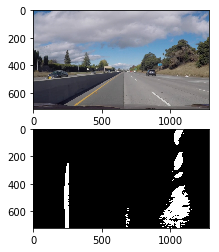

In [51]:
image = plt.imread('examples/ROI_area.png')

if(np.max(image) == 1):
    image = np.uint8(image * 255)
    
binary_warped = rgb_to_bin(image) * 255

plt.subplot(2,1,1)
plt.imshow(image)
plt.subplot(2,1,2)
plt.imshow(binary_warped, 'gray')


# Lane tracking

In [56]:
def hist_peaks(img):
    '''
    function finds left/right point as start position
    '''
    #    bottom_half = img[img.shape[0]//2:,:]
    img_f32 = img.astype(np.float32)
    histogram = np.sum(img_f32, axis = 0) / img_f32.shape[0]
    
    # print(np.max(histogram))
        
   
    # fig, ax = plt.subplots()
    # ax.plot(histogram,color='b')
    
    filt = np.array([1,1,1], dtype = np.float32)/3.0
    
    histogram1 = np.convolve(histogram.astype(np.float32), filt, 'same')
    # ax.plot(histogram1,color='g')
    
    mid_point_l = np.int(histogram1.shape[0]//3)
    mid_point_r = np.int(histogram1.shape[0] - mid_point_l)

    left_x = np.argmax(histogram1[:mid_point_l])
    center_x = np.argmax(histogram1[mid_point_l:mid_point_r]) + mid_point_l
    right_x = np.argmax(histogram1[mid_point_r:]) + mid_point_r
    
    left_val = histogram1[left_x]
    center_val = histogram1[center_x]
    right_val = histogram1[right_x]
    
    return (left_x, left_val, center_x, center_val, right_x, right_val)

def find_lines(image):
    '''
    TODO!!!
    '''
    
    image_size = image.shape
    zone_height = 10 #zone height in pixels
    zone_bott = image_size[0] - 20
    zone_top = 10
    zones_h = zone_bott - zone_top + 1;
    zones_num = zones_h // zone_height
    plt.imshow(image)
    
    for zone_cnt in range(1):
        yb = zone_bott - zone_height * zone_cnt
        yt = yb - zone_height # + 1
        image_zone = image[yt:yb,:]
        xleft, left_val, xcenter, center_val, xright, right_val = hist_peaks(image_zone)
        
        peaks = [-1,-1,-1];
        
        if (left_val > 0.4):
            peaks[0] = xleft
            
        if (center_val > 0.4):
            peaks[1] = xcenter
            
        if (right_val > 0.4):
            peaks[2] = xright
            
        left_lane = []
        right_lane = []
        
    

## Incremental search

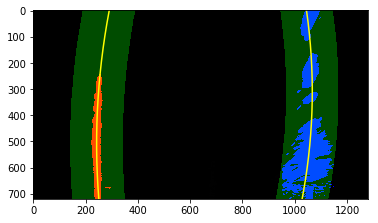

In [57]:
# Load our image - this should be a new frame since last time!
#binary_warped = mpimg.imread('warped_example.jpg')

# Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!

# vertical lines (1st-odrer polynom)
left_fit = np.array([ 0, 0, 240])
right_fit = np.array([ 0, 0, 1050])

def fit_poly(img_shape, leftx, lefty, rightx, righty):
    
    ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fitx, right_fitx, ploty

def search_around_poly(binary_warped, show=False):
    global left_fit
    global right_fit
    
   
    # HYPERPARAMETER
    # Choose the width of the margin around the previous polynomial to search
    # The quiz grader expects 100 here, but feel free to tune on your own!
    margin = 100

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit new polynomials
    left_fitx, right_fitx, ploty = fit_poly(binary_warped.shape, leftx, lefty, rightx, righty)
    
    ## Visualization ##
    if show:
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

        # Plot the polynomial lines onto the image
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.imshow(result)
    ## End visualization steps ##
    
    return left_fitx, right_fitx, ploty

# Run image through the pipeline
# Note that in your project, you'll also want to feed in the previous fits
left_fitx, right_fitx, ploty = search_around_poly(binary_warped, show=True)

# View your output


In [92]:
def measure_curvature_offset(left_fit, right_fit, ploty, img_center_x):
    '''
    Calculates the curvature of left/right lines and car offset [+ <--0--> -] in meters.
    '''
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 20/600 # meters per pixel in y dimension
    xm_per_pix = 3.7/820 # meters per pixel in x dimension
    
    # Start by generating our fake example data
    # Make sure to feed in your real data instead in your project!
        
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    #y_eval = np.max(ploty)
    y_eval = ploty[0]
    
    ##### TO-DO: Implement the calculation of R_curve (radius of curvature) #####
    if left_fit[0]:
        left_curverad = np.sqrt((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**3) / np.absolute(2*left_fit[0])
        #if left_curverad > 10000:
        #    left_curverad = np.Inf
    else:
        left_curverad = np.Inf
    
    if right_fit[0]:
        right_curverad = np.sqrt((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**3) / np.absolute(2*right_fit[0])
        #if right_curverad > 10000:
        #    right_curverad = np.Inf
    else:
        right_curverad = np.Inf
        
    x_left = left_fit[0] * y_eval**2 + left_fit[1] * y_eval + left_fit[2]
    x_right = right_fit[0] * y_eval**2 + right_fit[1] * y_eval + right_fit[2]
    offset_pix = (img_center_x - (x_left + x_right)/2) * xm_per_pix
        
    return left_curverad, right_curverad, offset_pix


## Process a videofile

In [105]:
def prepare_frame_full(frame):
    '''
    Proceed one frame of the video
    '''
    # I have to use global variable to manage a function' behavior
    global start
    global left_fit
    global right_fit
    
    img_shape = frame.shape
    
    rgb_to_bin(frame)

    binarized_frame = rgb_to_bin(frame)
    
    
    if  start:
        left_x, left_val, _, _, right_x, right_val = hist_peaks(binarized_frame)
        left_fit = [0, 0, left_x]
        right_fit = [0, 0, right_x]
        
        #left_fitx, right_fitx, ploty = fit_poly(img_shape, left_x, left_y, right_x, right_y)
        
    
    left_fitx, right_fitx, ploty = search_around_poly(binarized_frame)
    
    nin_points_num = 50;
    if len(left_fitx) < nin_points_num | len(right_fitx) < nin_points_num:
        start = 1
    
    left_curverad, right_curverad, car_offset = measure_curvature_offset(left_fit, right_fit, ploty, binarized_frame.shape[1]//2)
    
    left_pts = np.vstack((left_fitx,ploty)).astype(np.int32).T
    right_pts = np.vstack((right_fitx,ploty)).astype(np.int32).T
    
    warp_zero = np.zeros_like(binarized_frame).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    curve_left_text = 'Left radius: ' + '{0:.2f}'.format(left_curverad)
    curve_right_text = 'Right radius: ' + '{0:.2f}'.format(right_curverad)
    offset_text = 'Car offset: ' + '{0:+4.2f}'.format(car_offset)
    
    # text parameters
    font_face = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1
    text_thickness = 2
    
    #left_text_size = cv2.getTextSize(curve_left_text, font_face, font_scale, text_thickness)
    #right_text_size = cv2.getTextSize(curve_right_text, font_face, font_scale, text_thickness)
    #left_text_x = int(left_fit[0]*ploty[0] + left_fit[1]*ploty[0] + left_fit[2] - left_text_size[0][0]//2)
    
    left_text_x = 20
    center_text_x = img_shape[1]//2 - 200
    right_text_x = img_shape[1] - 300
    text_y = 50
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_1, (image.shape[1], image.shape[0])) 
    
    # Combine the result with the original image
    
    uf = undistort_frame(frame, k, dist).astype(np.uint8)
    
    result = cv2.addWeighted(uf, 1, newwarp, 0.3, 0)
    
    cv2.putText(result, curve_left_text, (left_text_x, text_y), font_face, font_scale, (255,0,0), text_thickness)
    cv2.putText(result, curve_right_text, (right_text_x, text_y), font_face, font_scale, (255,0,0), text_thickness)
    cv2.putText(result, offset_text, (center_text_x, text_y), font_face, font_scale, (255,0,0), text_thickness)
    
    return result


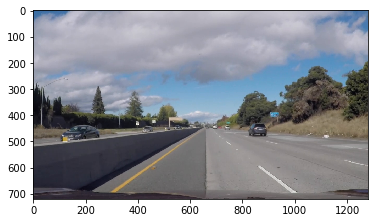

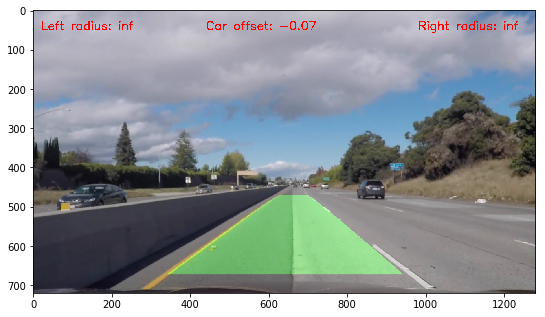

In [106]:
# single frame demo
start = 1
left_fit = [0, 0, 0]
right_fit = [0, 0, 0]

image = (plt.imread('examples/ROI_area.png')*255).astype(np.uint8)
plt.imshow(image)
plt.pause(0.1)

composed_frame = prepare_frame_full(image)
fig = plt.figure(figsize=(9,9))
plt.imshow(composed_frame)


In [107]:
def process_video(video_input):
    
    in_filename = os.path.basename(video_input)
    
    fileparts = os.path.splitext(in_filename)
    out_filename = fileparts[0] + '_combined' + fileparts[1]
    
    dirname = os.path.dirname(video_input)
    
    video_output = os.path.join(dirname, out_filename)
    
    print('--->> ',video_output)

    if os.path.exists(video_output):
        os.remove(video_output)
        
    video1 = VideoFileClip(video_input).subclip(0,5)
    video2 = video1.fl_image(prepare_frame_full)
    
    %time video2.write_videofile(video_output, audio=False)
    #video2.write_videofile(video_output, audio=False)

    
    HTML("""
    <video width="1280" height="720" controls>
    <source src="{0}">
    </video>
    """.format(video_output))

    print('Video has been recorded!')
    


In [108]:
#process_video('challenge_video.mp4')
process_video('project_video.mp4')


--->>  project_video_combined.mp4


t:   2%|▏         | 2/125 [00:00<00:07, 15.41it/s, now=None]

Moviepy - Building video project_video_combined.mp4.
Moviepy - Writing video project_video_combined.mp4



Moviepy - Done !
Moviepy - video ready project_video_combined.mp4
CPU times: user 17.2 s, sys: 421 ms, total: 17.6 s
Wall time: 12.4 s
Video has been recorded!
